<div align="center">  
  
# **Diffusion Models**  
  
</div>  
  
Welcome to this instructional section! We'll delve into the fascinating world of diffusion models, covering areas like text to image diffusion, image to image diffusion, and deconstructing the diffusion model pipeline. This tutorial is designed to be a step-by-step guide through the process. Let's look at the roadmap for this journey:  
  
---  

**Table of Contents**  
  
1. **Environment Configuration**    
    Setting up the appropriate environment, including the installation of necessary packages.  
  
2. **Text-to-Image Diffusion**    
    Understanding how diffusion models can generate images from text inputs.  
  
3. **Image-to-Image Diffusion**    
    Exploring how diffusion models can transform one image into another.  
  
4. **Diffusion Pipeline Deconstructed**    
    Breaking down the components of a diffusion pipeline to understand how it works.  
  
5. **Prompt Weighting**    
    Understaind howw to emphasize certain parts of a prompt for image generation.
  
---  
  
Let's get started!  
  
The sections covered will be: text to image diffusion, image to image diffusion, the diffusion pipeline deconstructed. Each of these components plays a crucial role in understanding and leveraging the power of diffusion models.  


# 1. Configure the Environment

In [3]:
! pip install diffusers
! pip install compel


[notice] A new release of pip is available: 23.2.1 -> 23.3
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 23.3
[notice] To update, run: python -m pip install --upgrade pip


In [4]:
import numpy as np, pandas as pd, requests
from functools import partial
from tqdm.auto import tqdm
from diffusers import AutoPipelineForText2Image, AutoPipelineForImage2Image
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler, UniPCMultistepScheduler
from compel import Compel, ReturnedEmbeddingsType
import torch
from torchvision import transforms
from torchmetrics.functional.multimodal import clip_score
from transformers import CLIPTextModel, CLIPTokenizer

transform = transforms.ToTensor()  

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt  

# 2. Text-to-Image Diffusion

For this section, we'll use a pipeline `AutoPipelineForText2Image` given by the [Diffusers](https://huggingface.co/docs/diffusers/tutorials/autopipeline) package for ease.

In [5]:
# set up a pipeline class to generate images

text2img_pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True).to("cuda:1")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
prompt = "American tank firing, wood cutting style, viking era, bevel with rune"

In [7]:
result = text2img_pipeline(prompt, num_inference_steps=25)

  0%|          | 0/25 [00:00<?, ?it/s]

In [8]:
result

StableDiffusionXLPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F9B886ABDF0>])

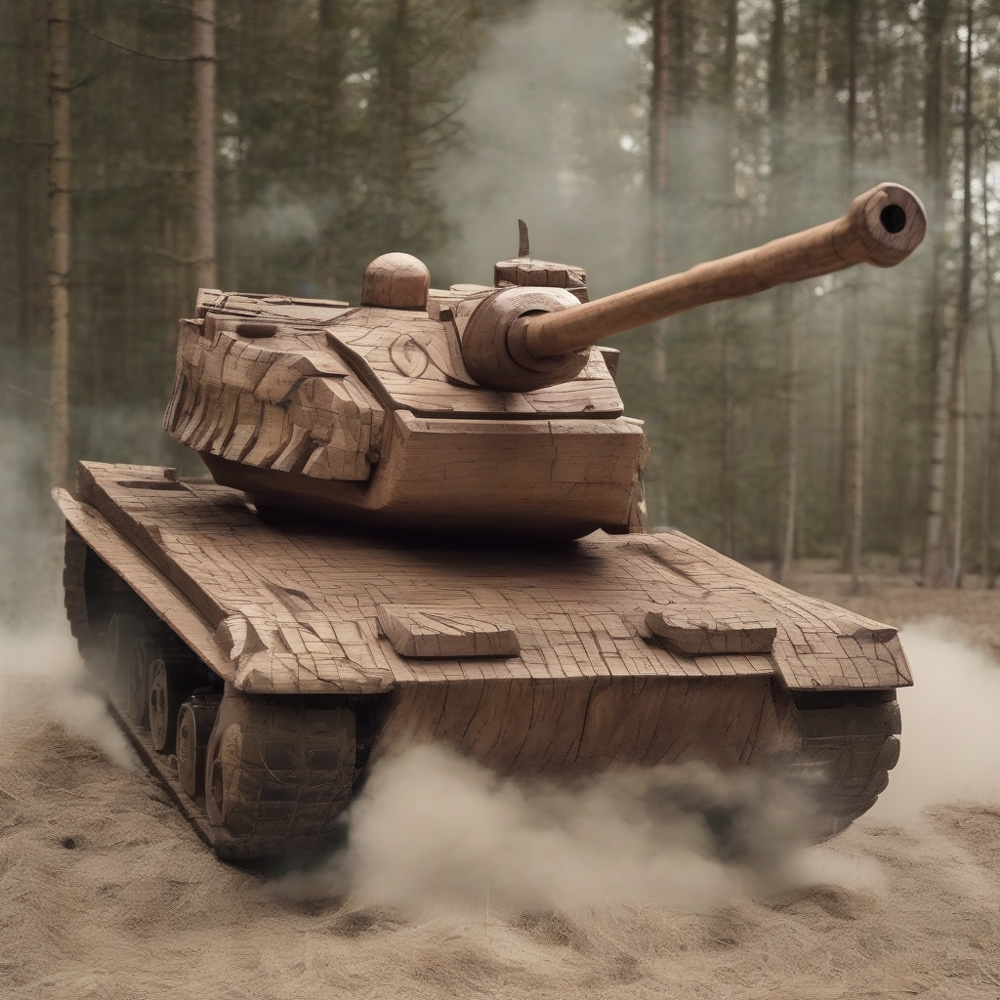

In [9]:
result.images[0]

Having generated an image, we can clook at some metrics. One is the CLIP score: CLIP score measures the compatibility of image-caption pairs. Higher CLIP scores imply higher compatibility 🔼. The CLIP score is a quantitative measurement of the qualitative concept “compatibility”. CLIP score has been found to correspond with human judgements about image quality

In [11]:
clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    clip_score = clip_score_fn(images, prompts).detach()
    return round(float(clip_score), 4)

In [12]:
calculate_clip_score(transform(result.images[0]), prompt)

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


23.6165

Now, lets look at another example

In [13]:
prompt = "Fisher Price my first MLM"

In [14]:
result = text2img_pipeline(prompt, num_inference_steps=25)

  0%|          | 0/25 [00:00<?, ?it/s]

In [15]:
result

StableDiffusionXLPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7F9BA9F85000>])

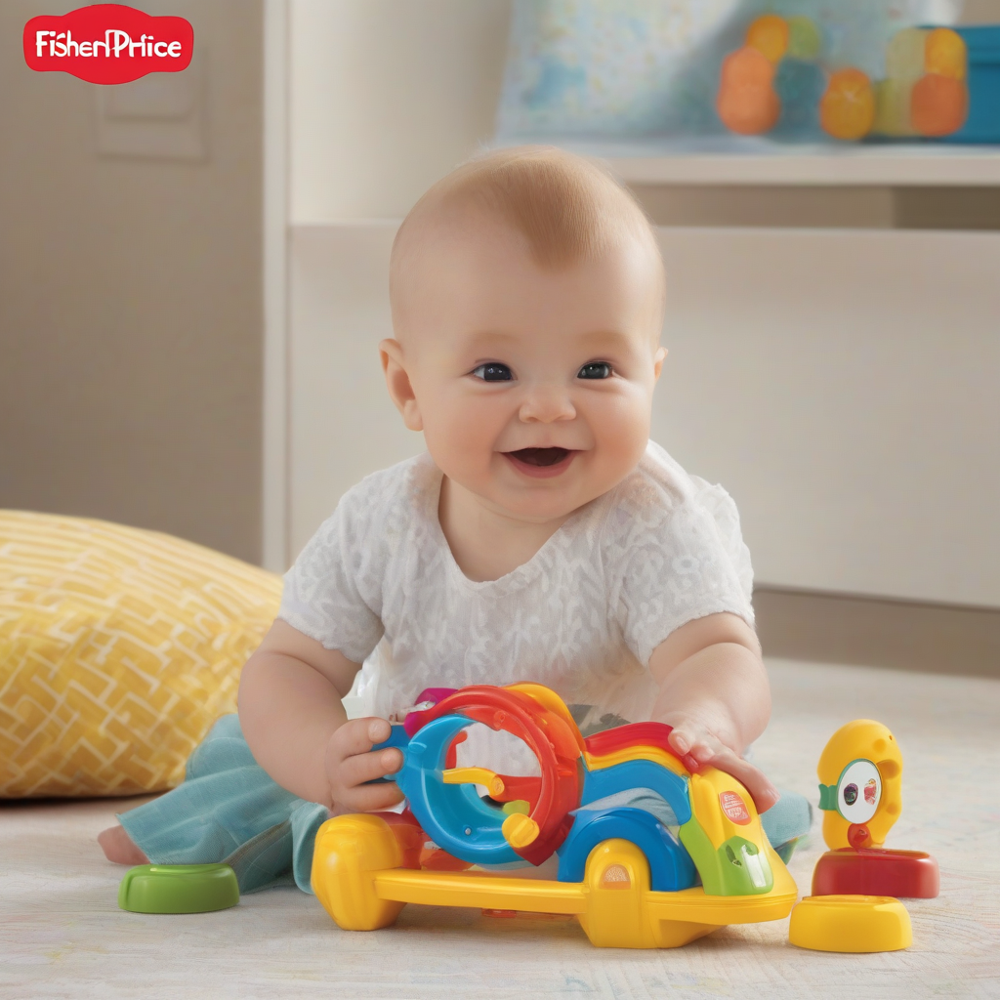

In [16]:
result.images[0]

In [17]:
calculate_clip_score(transform(result.images[0]), prompt)

22.527

# 3. Image-to-Image Diffusion

We will once again use a pipeline from the Diffusers package for ease of use

In [18]:
# Set up the pipeline class

img2img_pipeline = AutoPipelineForImage2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to("cuda:2")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [19]:
prompt = "a painting of a space marine moving across a farm field"

In [20]:
# Pull in an example image

url = "https://d3d00swyhr67nd.cloudfront.net/w800h800/collection/GMIII/MCAG/GMIII_MCAG_1905_21-001.jpg"

response = requests.get(url)
image = Image.open(BytesIO(response.content)).convert("RGB")
image.thumbnail((768, 768))

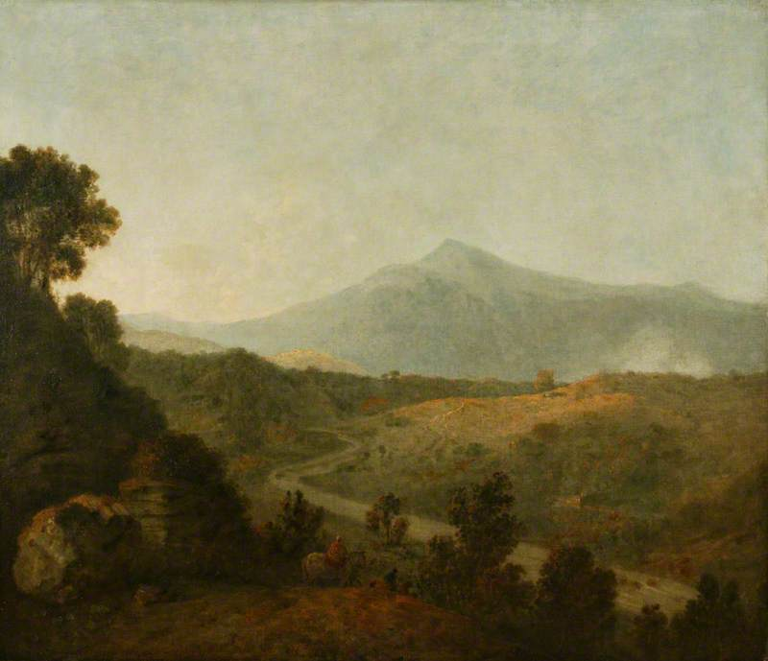

In [21]:
image

In [22]:
diff_image = img2img_pipeline(prompt=prompt, image=image, num_inference_steps=200, strength=0.75, guidance_scale=10.5).images[0]

  0%|          | 0/150 [00:00<?, ?it/s]

In an image-to-image diffusion model, such as the one implemented in the 'runwayml/stable-diffusion-v1-5' model,   
the 'strength' and 'guidance_scale' parameters control the degree of influence of the input guidance on the final image generation.  
  
- **Strength**: This parameter controls the intensity of the modifications made to the image based on the text prompt   
(i.e., the "strength" of the changes). A higher value would result in a more drastic transformation of the image,   
while a lower value would result in a more subtle transformation. In this example, a strength of 0.75 means the   
modifications to the image are relatively strong.  
  
- **Guidance_scale**: This parameter is a multiplier that controls how much the text prompt will guide the diffusion process.   
A larger guidance_scale results in the text prompt having a larger influence on the image transformation. In this example,   
a guidance_scale of 10.5 means the text prompt "a tank moving across a farm field" has a significant influence on the   
transformations applied to the image.  
  
Please note that the exact effects of these parameters can vary depending on the specific model and its training,   
and the best way to understand their effects is often through experimentation.  

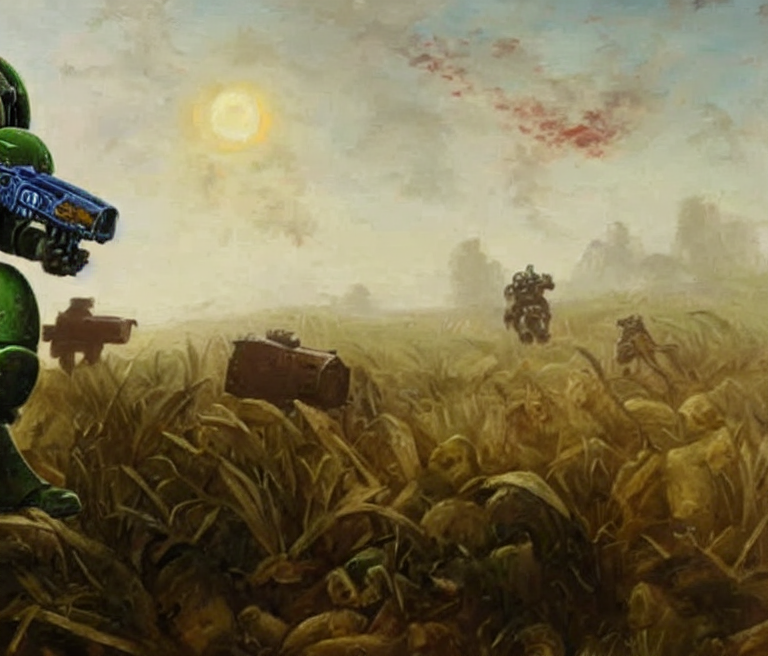

In [23]:
diff_image

In [24]:
calculate_clip_score(transform(diff_image), prompt)

21.0641

# 4. Diffusion Pipeline Deconstructed

Having owrked with the pipeline encapsulations, lets now deconstruct the pipeline to understand the neccesary components for a diffusion model. In particular, we will focus on the stable diffusion model that transforms text into imaes. Stable Diffusion is a text-to-image latent diffusion model. It is called a latent diffusion model because it works with a lower-dimensional representation of the image instead of the actual pixel space, which makes it more memory efficient. The encoder compresses the image into a smaller representation, and a decoder to convert the compressed representation back into an image. For text-to-image models, you’ll need:
- a `tokenizer` and an `encoder` to generate text embeddings
- a `model` to predict the noise residual
- and a `scheduler` which uses the noise residual to predict a less noisy image

The model denoises an image by taking random noise the size of the desired output and passing it through the model several times, where the embedded text is used to condition the UNet model and steer the diffusion process towards something that resembles the input prompt

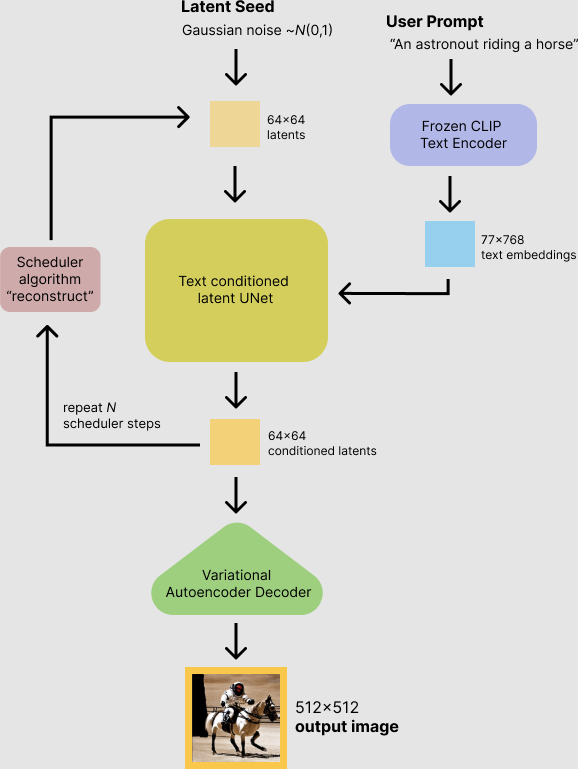

In [25]:
# import a pre-trained model to map the noisy image to a lantent state
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", use_safetensors=True)

# import a pre-trained text model
tokenizer = CLIPTokenizer.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="text_encoder", use_safetensors=True
)

# import a pre-trained model
unet = UNet2DConditionModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="unet", use_safetensors=True
)

# import a scheduler
scheduler = UniPCMultistepScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

In [26]:
# move all of the components to a GPU

torch_device = "cuda:3"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): LoRACompatibleConv(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): LoRACompatibleLinear(in_features=320, out_features=320, bias=False)
                (to_k): LoRACompatibleLinear(in_features=320, out_features=320, bias=False)
              

In [27]:
# Set up hpyerparameters for the stable diffusion model

prompts = ["a impressionist painting of a tank on the moon", "an aerial photo a cat sleeping on a military tank", 
          "Army Cyber Institute"]
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 100  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
batch_size = len(prompts)

### Create text embeddings to guide the diffusion process

In [28]:
text_input = tokenizer(
    prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

You’ll also need to generate the unconditional text embeddings which are the embeddings for the padding token. These need to have the same shape (batch_size and seq_length) as the conditional text_embeddings. The unconditional text embeddings, which are the embeddings for the padding token, are needed because the diffusion model will process these padding tokens as part of the sequence. Without embeddings for these padding tokens, the model would not know how to handle them, and this could potentially disrupt the diffusion process.

By ensuring that these unconditional text embeddings have the same shape (batch_size and seq_length) as the conditional text_embeddings, you allow the model to process all tokens in the sequence (including the padding tokens) in a consistent manner, thereby facilitating a smooth diffusion process.

In essence, the unconditional embeddings provide a kind of "default" embedding for tokens that don't carry any actual information (the padding tokens), so that the model can handle sequences of varying lengths in a consistent way.

In [29]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

In [30]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

### Create Random Noise

generate some initial random noise as a starting point for the diffusion process. This is the latent representation of the image, and it’ll be gradually denoised. At this point, the latent image is smaller than the final image size, so we need to generate to the smaller dimensions

In [31]:
# check the dimensions of the vae
2 ** (len(vae.config.block_out_channels) - 1)

8

In [32]:
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8)
)
latents = latents.to(torch_device)

### Denoise the image

Start by scaling the input with the initial noise distribution, sigma, the noise scale value, which is required for improved schedulers like `UniPCMultistepScheduler`. The reason for scaling the input with the initial noise distribution (sigma) is to ensure that the noise added to the image is in line with the model's learned noise schedule. The noise schedule is essentially a series of variance values that the model uses to add or subtract noise from the image at each step of the denoising process.

In [33]:
latents = latents * scheduler.init_noise_sigma

The last step is to create the denoising loop that’ll progressively transform the pure noise in latents to an image described by your prompt. Remember, the denoising loop needs to do three things:

1. Set the scheduler’s timesteps to use during denoising.
2. Iterate over the timesteps.
3. At each timestep, call the UNet model to predict the noise residual and pass it to the scheduler to compute the previous noisy sample.

In [34]:
# Set the number of timesteps for the diffusion process  
scheduler.set_timesteps(num_inference_steps)  
  
# We iterate over each timestep in the diffusion process  
for t in tqdm(scheduler.timesteps):  
      
    # In the case of classifier-free guidance, latents are duplicated to avoid two forward passes through the model.   
    # This is done to make the process more efficient.  
    latent_model_input = torch.cat([latents] * 2)  
  
    # The latent_model_input is scaled according to the current timestep. This is done to match the noise   
    # schedule defined by the scheduler.  
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)  
  
    # The UNet model predicts the noise residual. This prediction is used to update the image at the current timestep.  
    with torch.no_grad():  
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample  
  
    # The guidance process is performed here. The predicted noise is adjusted based on the guidance_scale and the difference   
    # between the text-conditioned and unconditioned noise predictions. This allows the text prompt to influence the   
    # denoising process.  
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)  
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)  
  
    # The image is updated for the next timestep based on the predicted noise. This step completes one iteration of the   
    # denoising process, and the process will repeat for the next timestep.  
    latents = scheduler.step(noise_pred, t, latents).prev_sample  


  0%|          | 0/100 [00:00<?, ?it/s]

### Decode the Images and Display them

In [35]:
# The latents are scaled. This scaling factor (1 / 0.18215) is a normalization constant to ensure that the latents fall within a certain range.  
latents = 1 / 0.18215 * latents  
  
# The VAE (Variational Autoencoder) is used to decode the latents back into images.  
with torch.no_grad():  
    images = vae.decode(latents).sample

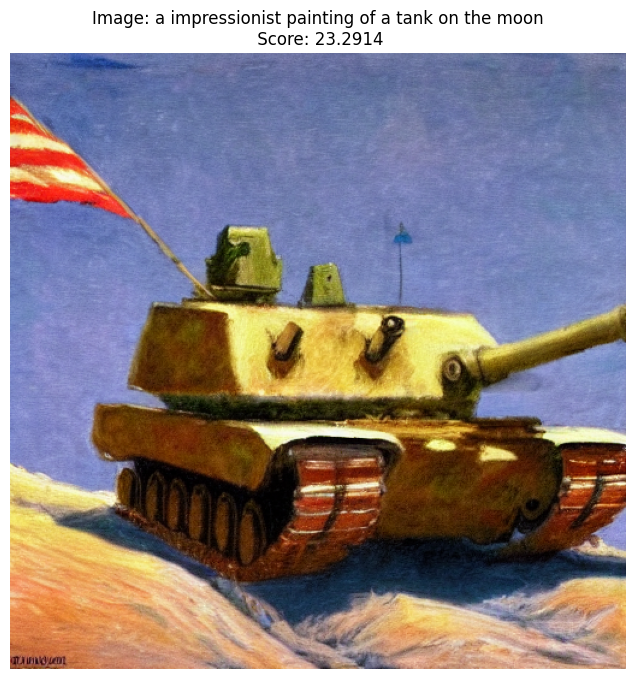

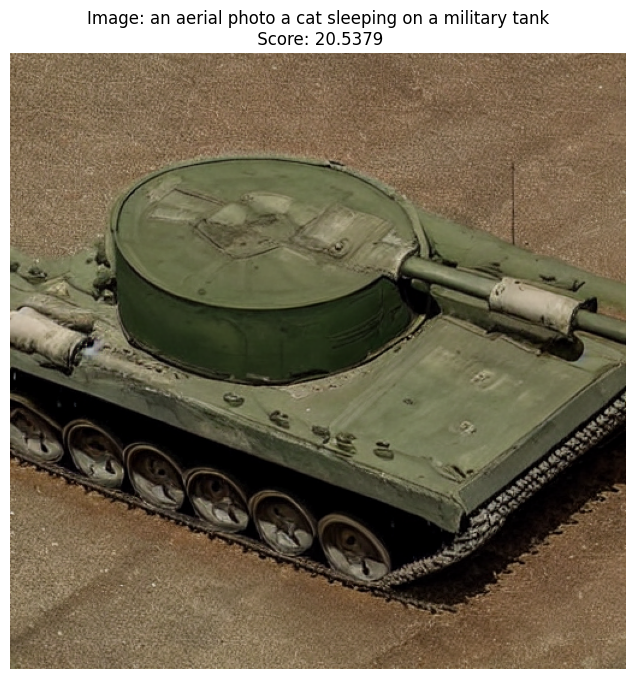

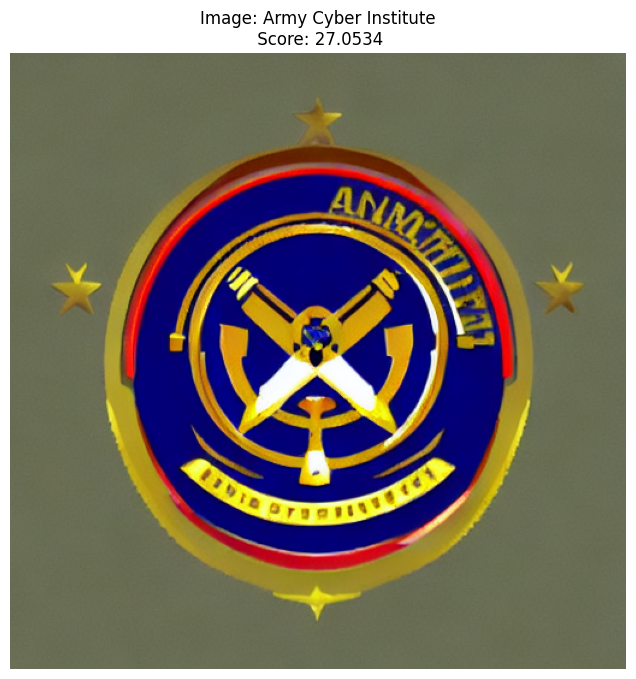

In [36]:
# The images are scaled to be in the range [0, 1], and any values outside this range are clamped. This is a common preprocessing step for images.  
images = (images / 2 + 0.5).clamp(0, 1).squeeze()  
  
# The images are permuted to change the order of the dimensions (to match the expected input format for the image processing library),  
# scaled to be in the range [0, 255] (the standard range for pixel values in an image),   
# converted to 8-bit unsigned integers, and moved to the CPU memory from the GPU memory.  
images = (images.permute(0, 2, 3, 1) * 255).to(torch.uint8).cpu().numpy()  
  
# For each image and corresponding prompt, the image is displayed and its CLIP score is calculated and displayed.  
for image, prompt in zip(images, prompts):    
    plt.figure(figsize=(8,8))    
    plt.imshow(image)    
    plt.title(f'Image: {prompt}\n Score: {calculate_clip_score(transform(image), prompt)}')    
    plt.axis('off')    
    plt.show()

# 5. Prompt Weighting
Prompt weighting provides a way to emphasize or de-emphasize certain parts of a prompt, allowing for more control over the generated image.

In [37]:
prompt = "American tank firing into some trees, with a viking riding it, ukiyo-e style painting"

In [38]:
first_image = text2img_pipeline(prompt, num_inference_steps=100).images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

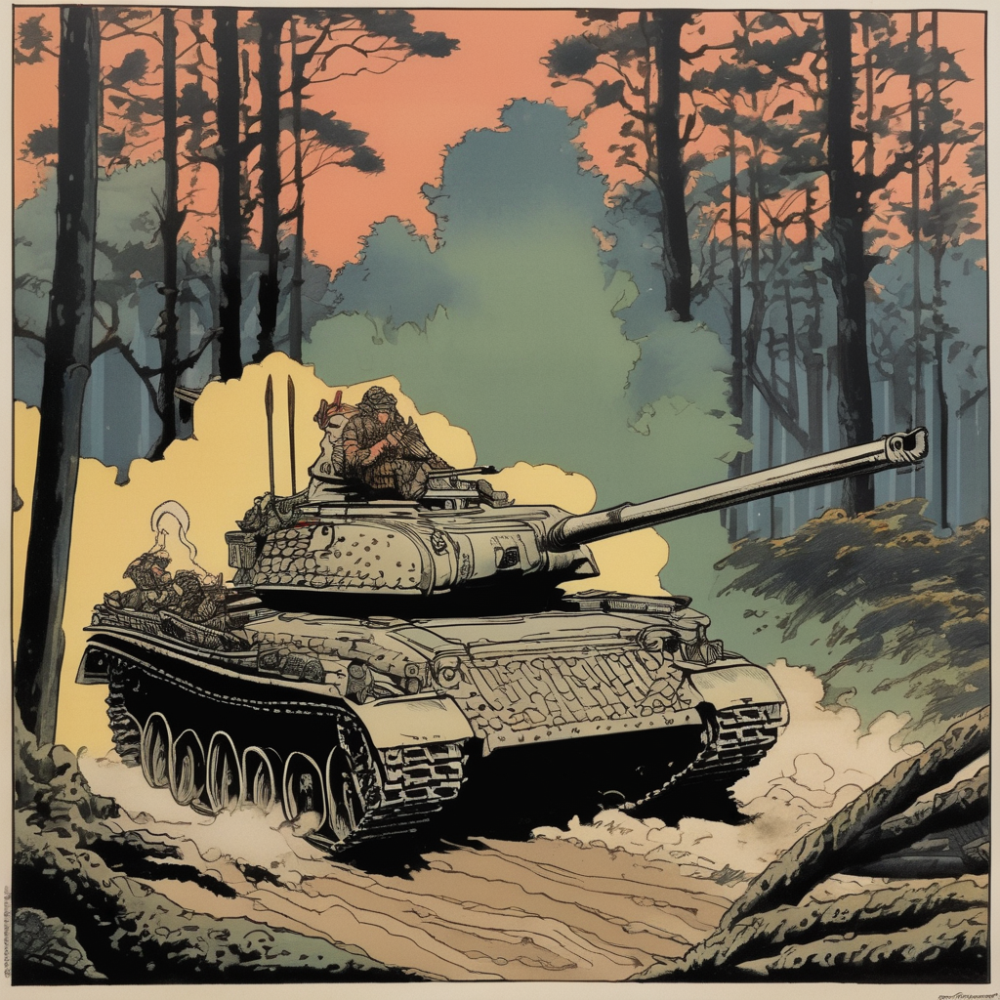

In [39]:
first_image

Now, we'll use the `compel` package to up-weight or down-weight certain areas of prompt. For `compel` + corresponds to the value 1.1, ++ corresponds to 1.1^2, and so on. Similarly, - corresponds to 0.9 and -- corresponds to 0.9^2. 

In [40]:
# compel_proc = Compel(tokenizer=text2img_pipeline.tokenizer, text_encoder=text2img_pipeline.text_encoder)

compel = Compel(
  tokenizer=[text2img_pipeline.tokenizer, text2img_pipeline.tokenizer_2] ,
  text_encoder=[text2img_pipeline.text_encoder, text2img_pipeline.text_encoder_2],
  returned_embeddings_type=ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED,
  requires_pooled=[False, True]
)

In [41]:
prompt = "(American tank)++ firing into some trees, with a viking riding it, (ukiyo-e style painting)+"
conditioning, pooled = compel(prompt)

In [44]:
second_image = text2img_pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, num_inference_steps=100).images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

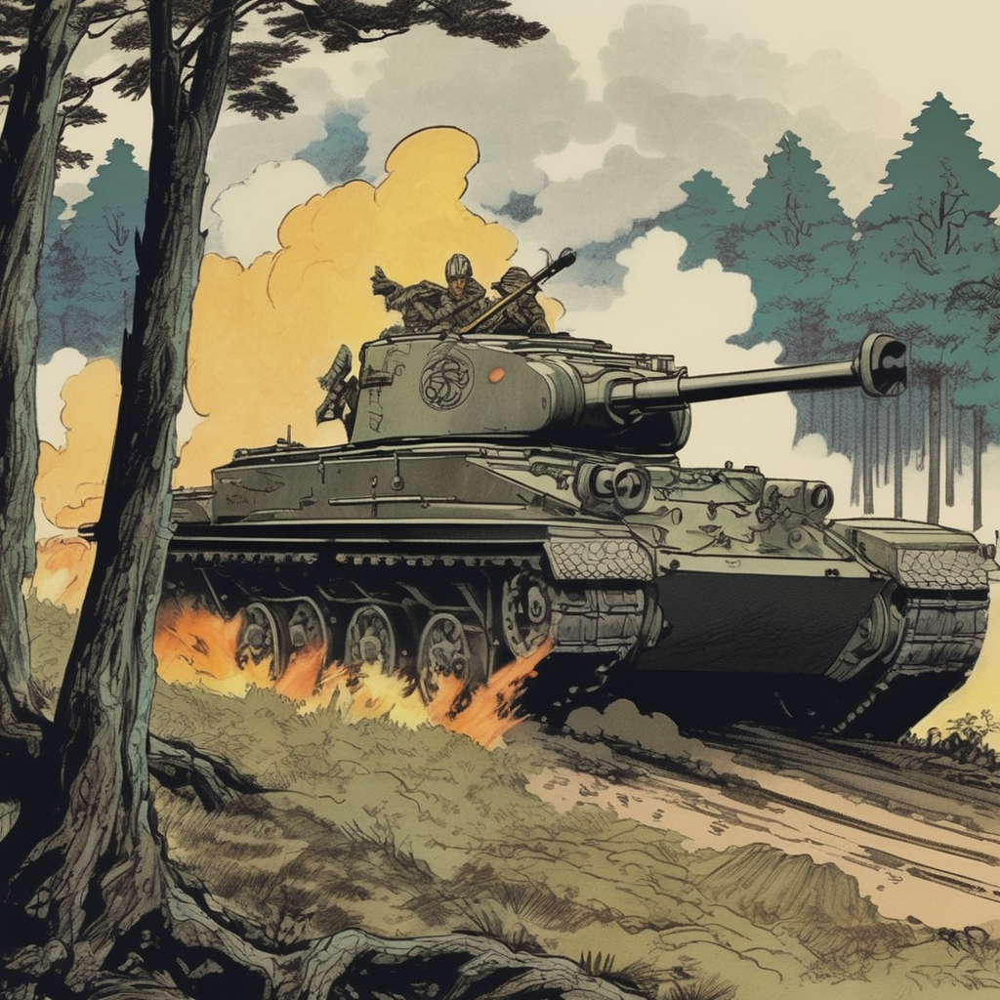

In [45]:
second_image

### Blending & Conjunction

You can also create a weighted blend of prompts by adding .blend() to a list of prompts and passing it some weights. 

In [46]:
prompt = '''("American tank, romantic-style painting", "viking warrior").blend(0.7,0.7)'''
conditioning, pooled = compel(prompt)

In [47]:
third_image = text2img_pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, num_inference_steps=100).images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

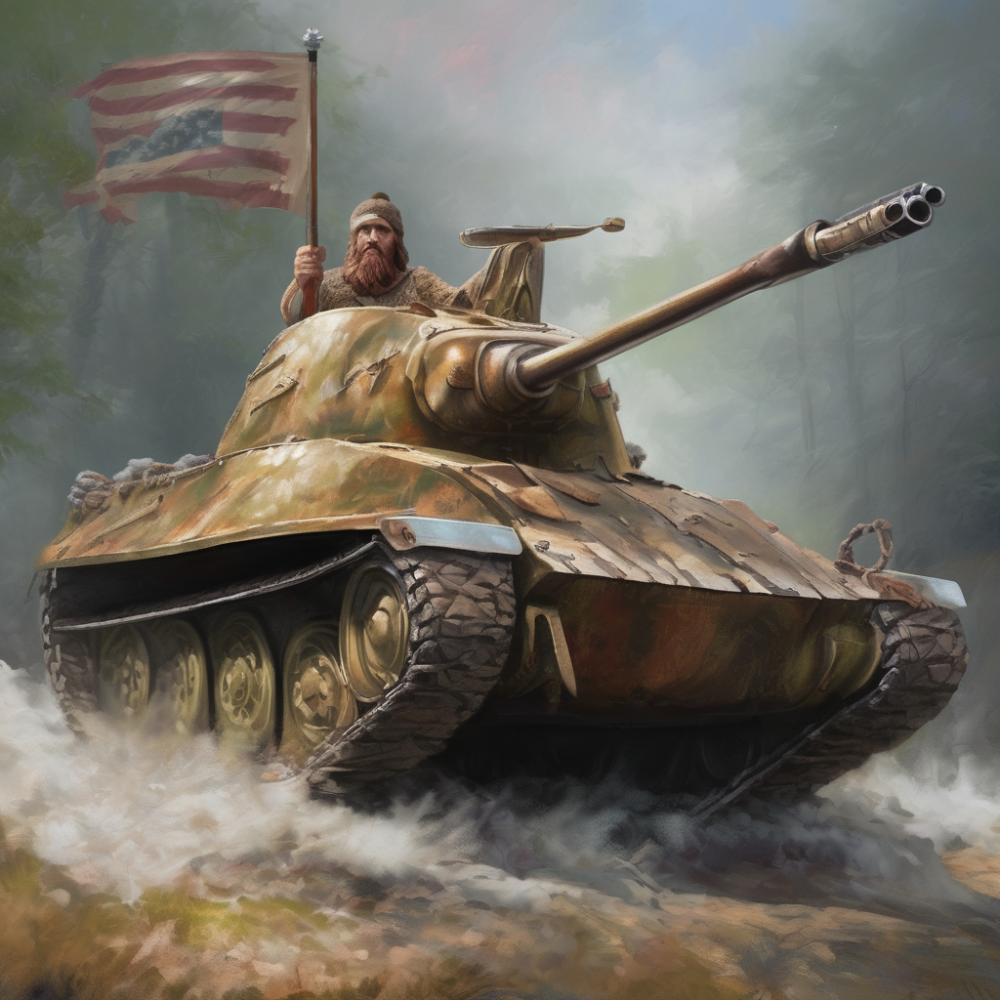

In [48]:
third_image

In [49]:
prompt = '''["American tank", "magical forest", "viking warrior"].and()'''
conditioning, pooled = compel(prompt)

In [50]:
fourth_image = text2img_pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, num_inference_steps=100).images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

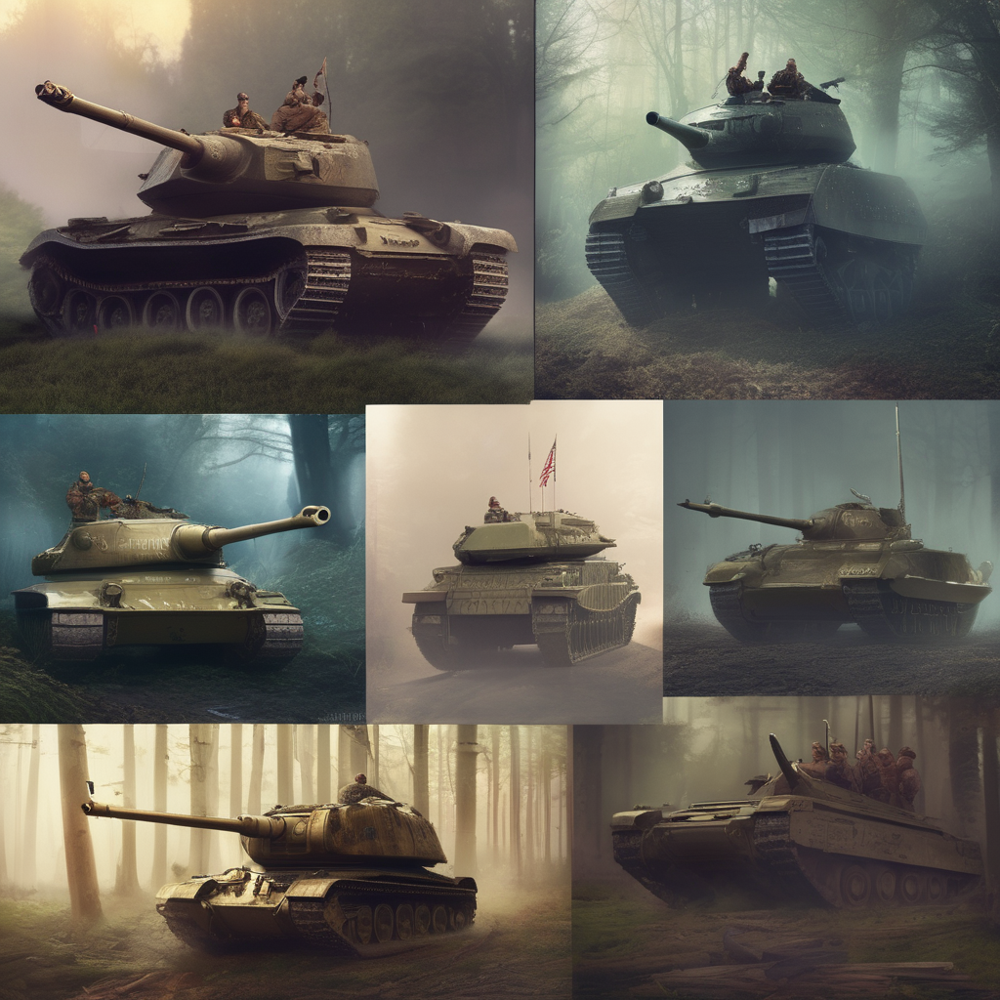

In [51]:
fourth_image